In [12]:
import requests
import numpy as np
import time

def send_bbox_and_get_masks(bbox):
    base =  "https://4f66-34-172-135-61.ngrok-free.app"
    url = f"{base}/predict/"
    response = requests.post(url, json={"box": bbox})
    if response.status_code == 200:
        # Save the received compressed data to a file
        with open("output_data_compressed.npz", "wb") as f:
            f.write(response.content)
        # Load the arrays from the compressed file
        with np.load("output_data_compressed.npz") as data:
            masks = data["masks"]
            scores = data["scores"]
        return masks, scores
    else:
        print(f"Error: {response.status_code}")
        return None, None

# Example usage
bbox = [469, 1163, 1728, 2473]
s = time.time()
masks, scores = send_bbox_and_get_masks(bbox)
e = time.time()
print(f'total time = {e-s}')
if masks is not None and scores is not None:
    print("Masks:", masks)
    print("Scores:", scores)

total time = 1.0908071994781494
Masks: [[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
Scores: [0.9714939]


In [22]:
import numpy as np
np.random.seed(3)

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))


def show_res(masks, scores, input_point, input_label, input_box, image):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10,10))
        plt.imshow(image)
        show_mask(mask, plt.gca())
        if input_box is not None:
            box = input_box[i]
            show_box(box, plt.gca())
        if (input_point is not None) and (input_label is not None):
            show_points(input_point, input_label, plt.gca())

        print(f"Score: {score:.3f}")
        plt.axis('off')
        plt.show()


def show_res_multi(masks, scores, input_point, input_label, input_box, image):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    for mask in masks:
        show_mask(mask, plt.gca(), random_color=True)
    for box in input_box:
        show_box(box, plt.gca())
    for score in scores:
        print(f"Score: {score:.3f}")
    plt.axis('off')
    plt.show()
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)


Score: 0.971


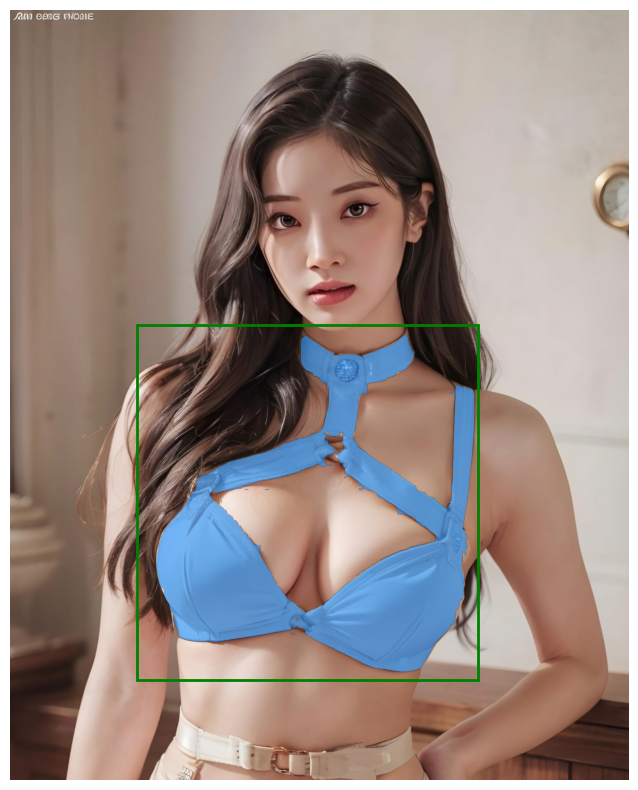

In [17]:
from PIL import Image
import matplotlib.pyplot as plt
input_box = np.array(bbox)
image = Image.open(r"C:\Users\ALL USER\Downloads\Picsart_24-03-16_16-25-10-385 (1) (1).jpg")
input_box_2d = np.expand_dims(input_box, axis=0)
input_point, input_label = None, None
show_res(masks,scores,input_point, input_label, input_box_2d, image)

In [ ]:
import time
s= time.time()
input_box = np.array(bbox)
image = Image.open(img_path)
input_box_2d = np.expand_dims(input_box, axis=0)
input_point, input_label = None, None
show_res(masks,scores,input_point, input_label, input_box_2d, image)
e = time.time()
print(e-s)

In [5]:
import requests
from pathlib import Path
from PIL import Image
import io

def upload_image_as_pil(img, server_url: str, threshold: float):
    try:
        file_path='image.jpeg'
        # Convert the image to RGB (in case it's not already in RGB format)
        img = img.convert("RGB")
        
        # Compress and save the image to a BytesIO stream
        buffer = io.BytesIO()
        img.save(buffer, format="JPEG", quality=100)  # Adjust quality as needed
        buffer.seek(0)  # Reset the stream position

        # Send the image data as a binary stream
        response = requests.post(
            server_url,
            files={"file": (file_path, buffer, "image/jpeg")},
            data={"threshold": str(threshold)},  # Send additional form data
        )

        # Check the response
        if response.status_code == 200:
            results = response.json()
            
            # print("Response:", results['results'])
            pass
        else:
            print("Error:", response.status_code, response.text)

    except Exception as e:
        print(f"An error occurred: {e}")
    return results['results']




# Base URL of the server
base_url = "https://8ea8-34-105-121-69.ngrok-free.app"
endpoint = "/upload_process/"
img_path= r"C:\Users\ALL USER\Downloads\cute.png"
img_path = r"C:\Users\ALL USER\Desktop\e\ui\p.png"
# img_path = r"C:\Users\ALL USER\Downloads\Picsart_24-03-16_16-25-10-385 (1) (1).jpg"
threshold_value = 0.15
img = Image.open(img_path)



# Upload the image
start_time = time.time()
results = upload_image_as_pil(img, f"{base_url}{endpoint}", threshold_value)
top_left_corner,top_right_corner,bottom_left_corner,bottom_right_corner,top_middle_side,bottom_middle_side, left_middle_side,right_middle_side ,center_point ,filtered_results,all_object,all_b =results
print(results)
end_time = time.time()
print(f"Time taken: {end_time - start_time:.2f} seconds")


[['Home/X', 'Home /X', 'cognitivecomp', 'My Drive - Goc', 'C', 'A', 'pinterest.com/dahyundarwin/dahyun-profile/', 'Pinterest=', 'dahyun!', 'AI ARTS', '29', 'Google Drive icon', 'x icon', 'fast backward icon', 'unknown icon or logo', 'star icon', 'home icon', 'x icon', 'x icon', 'x icon', 'x icon', 'rotate icon', 'Heart icon', 'x icon', 'unknown icon or logo', 'unknown icon or logo', 'fast backward icon', 'unknown icon or logo', 'unknown icon or logo', 'unknown icon or logo', '3 line icon', 'unknown icon or logo', 'photo', 'woman', 'woman', 'woman'], ['Building Ilama.', 'lovely-brown1', 'P', '4Pinterest', 'Dahwin', 'Dahwin', 'star icon', 'mouse cursor icon', 'star icon', 'three dot icon', 'restore down', 'search icon', 'unknown icon or logo', 'unknown icon or logo', 'arrow down or download icon', 'star icon', 'x icon', '+ icon', 'x icon', 'x icon', 'arrow down or download icon', 'notifications icon', 'unknown icon or logo', 'unknown icon or logo', 'unknown icon or logo', 'rotate icon', 

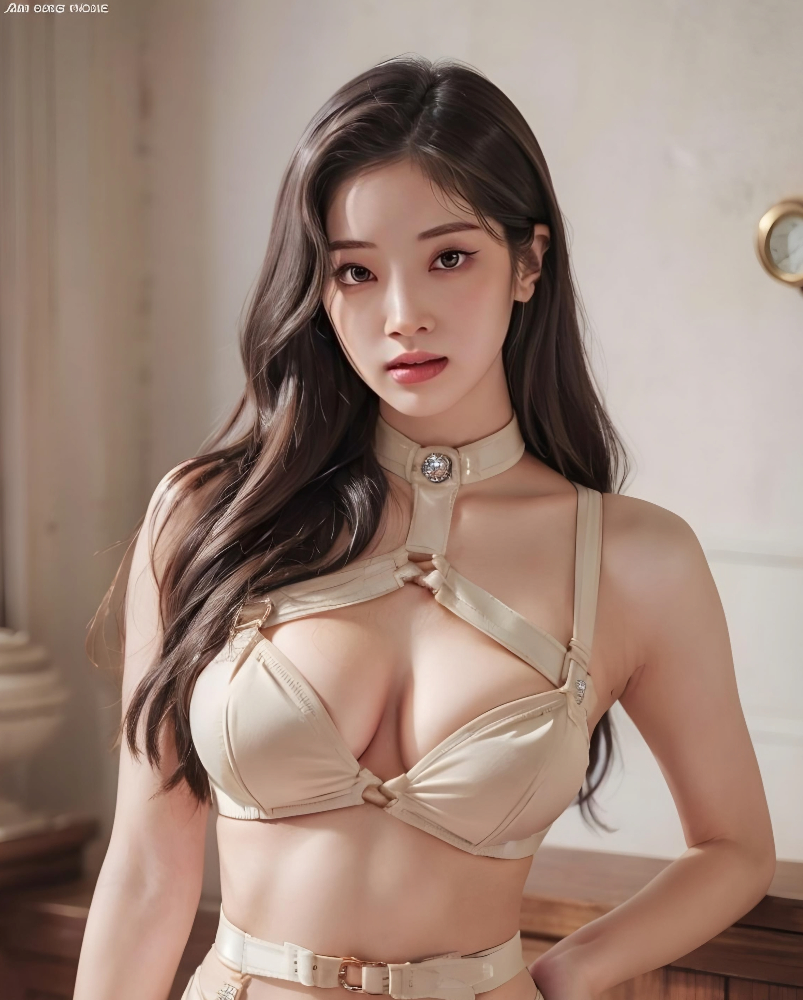

Response: [['girl', 'girl'], [], ['stool'], [], [], ['belt', 'bikini top', 'bikini top', 'tie', 'tie', 'waist'], [], [], [], {'top_left_corner': {'objects': ['girl', 'girl'], 'bboxes': [[206.5, 152.0, 2208.0, 2828.0], [575.0, 151.0, 1819.0, 1546.0]]}, 'top_right_corner': {'objects': [], 'bboxes': []}, 'bottom_left_corner': {'objects': ['stool'], 'bboxes': [[3.25, 2284.0, 288.75, 2836.0]]}, 'bottom_right_corner': {'objects': [], 'bboxes': []}, 'top_middle_side': {'objects': [], 'bboxes': []}, 'bottom_middle_side': {'objects': ['belt', 'bikini top', 'bikini top', 'tie', 'tie', 'waist'], 'bboxes': [[579.0, 2580.0, 1513.0, 2836.0], [519.0, 1230.0, 1749.0, 2444.0], [633.0, 1335.0, 1715.0, 1961.0], [1048.0, 1164.0, 1500.0, 1598.0], [1145.0, 1270.0, 1311.0, 1594.0], [582.0, 2172.0, 1580.0, 2460.0]]}, 'left_middle_side': {'objects': [], 'bboxes': []}, 'right_middle_side': {'objects': [], 'bboxes': []}, 'center_point': {'objects': [], 'bboxes': []}}, ['belt', 'girl', 'bikini top', 'bikini top',

In [12]:
import requests
from pathlib import Path
from PIL import Image
import io

def upload_image_as_pil(file_path: str, server_url: str, threshold: float):
    from PIL import Image
    try:
        file = Path(file_path)
        if not file.exists() or not file.is_file():
            print(f"File not found: {file_path}")
            return

        # Open the image using PIL
        with Image.open(file) as img:
            # Convert the image to RGB (in case it's not already in RGB format)
            img = img.convert("RGB")
            
            # Compress and save the image to a BytesIO stream
            buffer = io.BytesIO()
            img.save(buffer, format="JPEG", quality=100)  # Adjust quality as needed
            buffer.seek(0)  # Reset the stream position

            # Send the image data as a binary stream
            response = requests.post(
                server_url,
                files={"file": (file_path, buffer, "image/jpeg")},
                data={"threshold": str(threshold)},  # Send additional form data
            )

        # Check the response
        if response.status_code == 200:
            results = response.json()
            
            print("Response:", results['results'])
            pass
        else:
            print("Error:", response.status_code, response.text)

    except Exception as e:
        print(f"An error occurred: {e}")


# Example usage
if __name__ == "__main__":
    import time
    from IPython.display import Image, display

    # Base URL of the server
    base_url =   "https://c662-34-105-121-69.ngrok-free.app"
    endpoint = "/upload_process/"
    img_path= r"C:\Users\ALL USER\Downloads\cute.png"
    img_path = r"C:\Users\ALL USER\Downloads\Picsart_24-03-16_16-25-10-385 (1) (1).jpg"
    threshold_value = 0.15

    # Display the image before upload
    display(Image(filename=img_path))

    # Upload the image
    start_time = time.time()
    upload_image_as_pil(img_path, f"{base_url}{endpoint}", threshold_value)
    end_time = time.time()
    print(f"Time taken: {end_time - start_time:.2f} seconds")


Received results from /full/ endpoint:
[['girl', 'girl'], [], ['stool'], [], [], ['belt', 'bikini top', 'bikini top', 'tie', 'tie'], [], [], [], {'top_left_corner': {'objects': ['girl', 'girl'], 'bboxes': [[206.5, 152.0, 2208.0, 2828.0], [574.0, 150.5, 1818.0, 1550.0]]}, 'top_right_corner': {'objects': [], 'bboxes': []}, 'bottom_left_corner': {'objects': ['stool'], 'bboxes': [[3.125, 2286.0, 289.0, 2834.0]]}, 'bottom_right_corner': {'objects': [], 'bboxes': []}, 'top_middle_side': {'objects': [], 'bboxes': []}, 'bottom_middle_side': {'objects': ['belt', 'bikini top', 'bikini top', 'tie', 'tie'], 'bboxes': [[579.0, 2580.0, 1513.0, 2836.0], [519.0, 1230.0, 1749.0, 2444.0], [634.5, 1335.0, 1718.0, 1961.0], [1049.0, 1163.0, 1501.0, 1599.0], [1146.0, 1269.0, 1310.0, 1597.0]]}, 'left_middle_side': {'objects': [], 'bboxes': []}, 'right_middle_side': {'objects': [], 'bboxes': []}, 'center_point': {'objects': [], 'bboxes': []}}, ['belt', 'girl', 'bikini top', 'bikini top', 'tie', 'girl', 'tie',

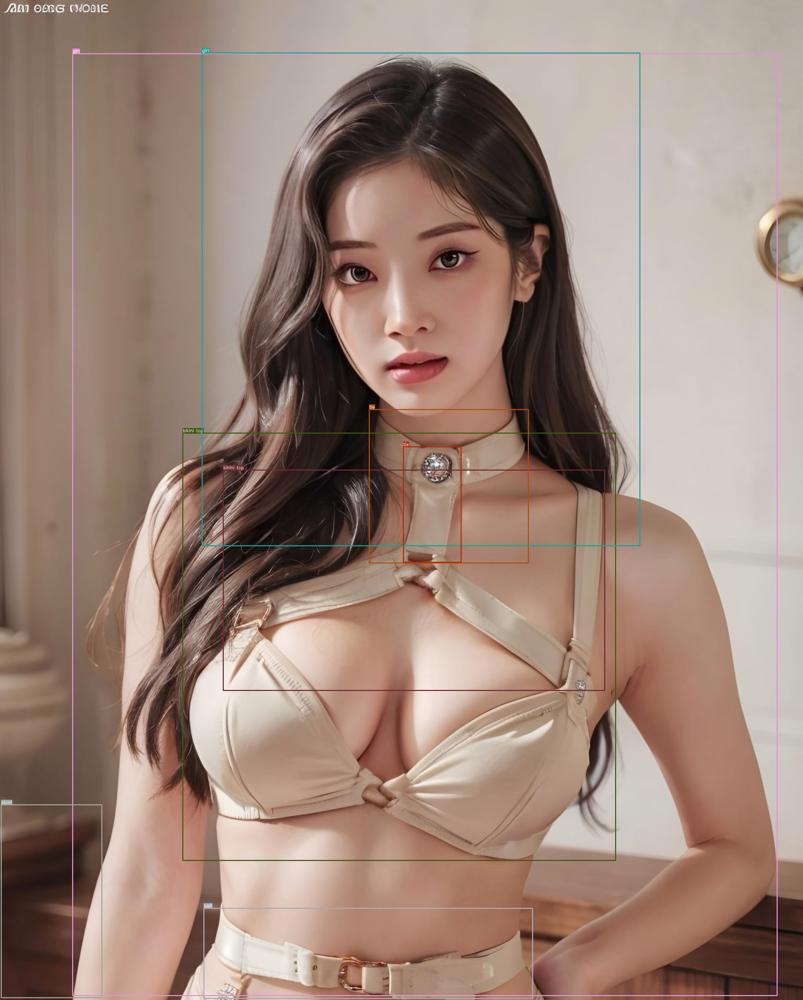

In [32]:
import cv2
import numpy as np
import time

def draw_bbox_and_label(img, bbox, label, color):
    """
    Draw bounding box and label using OpenCV with smaller font
    
    Args:
        img: OpenCV image (numpy array)
        bbox: tuple/list of (x1, y1, x2, y2)
        label: string label to display
        color: tuple of (B, G, R) for OpenCV
    """
    x1, y1, x2, y2 = map(int, bbox)
    
    # Draw rectangle
    cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
    
    # Use smaller font settings
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.4  # Reduced from 0.6
    thickness = 1
    (label_width, label_height), baseline = cv2.getTextSize(label, font, font_scale, thickness)
    
    # Draw filled rectangle for label background with smaller padding
    cv2.rectangle(img, 
                 (x1, y1 - label_height - 5),  # Reduced padding from 10 to 5
                 (x1 + label_width, y1),
                 color, 
                 -1)
    
    # Put text with adjusted position
    cv2.putText(img, 
                label,
                (x1, y1 - 3),  # Adjusted y position for better alignment
                font,
                font_scale,
                (255, 255, 255),
                thickness)
    
    return img

def process_image_with_bboxes(image_path, objects, bboxes,printt=None, output_path=None,):
    """
    Process image and draw all bounding boxes
    
    Args:
        image_path: path to input image
        objects: list of object labels
        bboxes: list of bounding boxes (x1,y1,x2,y2)
        output_path: path to save output image (optional)
    Returns:
        processed image as numpy array
    """
    # Read and resize image
    img = cv2.imread(image_path)
    # img = cv2.resize(img, (1920, 1080))
    
    # Process each bbox
    for obj, bbox in zip(objects, bboxes):
        print(obj)
        print(bbox)
        # if printt!=None:
        #     print(obj)
        # Random BGR color
        color = (
            np.random.randint(0, 255),
            np.random.randint(0, 255),
            np.random.randint(0, 255)
        )
        img = draw_bbox_and_label(img, bbox, obj, color)
    
    # Save if output path provided
    if output_path:
        cv2.imwrite(output_path, img)
        
    return img










import requests
import time
from PIL import Image

# Define the API endpoint
url = f"{base_url }/full_process/"


s = time.time()
# Send a POST request to the /full/ endpoint
try:
    response = requests.post(url)
    response.raise_for_status()  # Raise an exception for HTTP errors

    # Parse the JSON response
    results = response.json()

    # Print the results
    print("Received results from /full/ endpoint:")
    top_left_corner,top_right_corner,bottom_left_corner,bottom_right_corner,top_middle_side,bottom_middle_side, left_middle_side,right_middle_side ,center_point ,filtered_results,all_object,all_b = results['results']
    
    print(results['results'])

except requests.exceptions.RequestException as e:
    print(f"An error occurred while communicating with the API: {e}")


start = time.time()
output_path=None
img = process_image_with_bboxes(
    img_path,
    all_object,
    all_b,      
    output_path
)

end = time.time()
print(f"Processing time: {end - start:.4f} seconds")

# Convert the color format from BGR to RGB
image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Convert the OpenCV image (NumPy array) to a PIL image
pilimg = Image.fromarray(image_rgb)

e = time.time()
print(e-s)

pilimg

In [8]:
import requests
import numpy as np
import time
base_url =  "https://ac9a-35-203-186-217.ngrok-free.app"
def send_bbox_and_get_masks(bbox):
    url = f"{base_url}/predict/"
    response = requests.post(url, json={"box": bbox})
    if response.status_code == 200:
        # Save the received compressed data to a file
        with open("output_data_compressed.npz", "wb") as f:
            f.write(response.content)
        # Load the arrays from the compressed file
        with np.load("output_data_compressed.npz") as data:
            masks = data["masks"]
            scores = data["scores"]
        return masks, scores
    else:
        print(f"Error: {response.json()}")
        return None, None


bbox = [209.75, 235.625, 287.25, 273.0]
bbox = [519.0, 1230.0, 1749.0, 2444.0]
bbox = [round(value) for value in bbox] # int bbox is required

s = time.time()
masks, scores = send_bbox_and_get_masks(bbox)
e = time.time()
print(f'total time = {e-s}')
if masks is not None and scores is not None:
    print("Masks:", masks)
    print("Scores:", scores)

total time = 1.178154468536377
Masks: [[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
Scores: [0.96235955]


In [ ]:
# def show_res(masks, scores, input_point, input_label, input_box, image):
#     for i, (mask, score) in enumerate(zip(masks, scores)):
#         output = show_mask(mask, image.copy())
#         if input_box is not None:
#             output = show_box(output, input_box[i])
#         if input_point is not None and input_label is not None:
#             output = show_points(output, input_point, input_label)

#         print(f"Score: {score:.3f}")
#         return output

In [30]:
# def show_res(masks, scores, input_point, input_label, input_box, image):
#     for i, (mask, score) in enumerate(zip(masks, scores)):
#         output = show_mask(mask, image.copy())
#         if input_box is not None:
#             output = show_box(output, input_box[i])
#         if input_point is not None and input_label is not None:
#             output = show_points(output, input_point, input_label)
        
#         # Resize to fit the display size
#         resized_output = resize_to_fit_screen(output, screen_width, screen_height)
        
#         print(f"Score: {score:.3f}")
#         return resized_output


In [4]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2

import numpy as np
import cv2
import pyautogui

# Get screen width and height
screen_width, screen_height = pyautogui.size()

# Print the display size
print(f"Display size: {screen_width}x{screen_height}")
def resize_to_fit_screen(image, max_width, max_height):
    """
    Resize the image to fit within the specified max_width and max_height
    while preserving the aspect ratio.
    """
    height, width = image.shape[:2]
    scale = min(max_width / width, max_height / height)
    new_width = int(width * scale)
    new_height = int(height * scale)
    resized_image = cv2.resize(image, (new_width, new_height), interpolation=cv2.INTER_AREA)
    return resized_image

def show_mask(mask, image, random_color=False):
    """
    Overlay the mask on the image with a specific or random BGR color.
    """
    overlay = image.copy()
    h, w = mask.shape[-2:]
    mask = mask.reshape(h, w, 1).astype(np.uint8)

    if random_color:
        color = np.random.randint(0, 256, 3, dtype=np.uint8)  # Random BGR color
    else:
        color = np.array([255, 144, 30], dtype=np.uint8)  # Fixed BGR for blue

    # Apply the mask color
    for c in range(3):  # Blend each color channel
        overlay[:, :, c] = np.where(mask.squeeze() == 1, 
                                    overlay[:, :, c] * 0.4 + color[c] * 0.6, 
                                    overlay[:, :, c])
    return overlay


def show_points(image, coords, labels, marker_size=10):
    for point, label in zip(coords, labels):
        color = (0, 255, 0) if label == 1 else (0, 0, 255)  # Green for positive, red for negative
        cv2.circle(image, tuple(point), marker_size, color, thickness=-1)  # Filled circle
    return image

def show_box(image, box):
    x0, y0, x1, y1 = map(int, box)
    cv2.rectangle(image, (x0, y0), (x1, y1), (0, 255, 0), thickness=2)  # Green box
    return image

def show_res(masks, scores, input_point, input_label, input_box, image):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        output = show_mask(mask, image.copy())
        if input_box is not None:
            output = show_box(output, input_box[i])
        if input_point is not None and input_label is not None:
            output = show_points(output, input_point, input_label)
        
        # Resize to fit the display size
        resized_output = resize_to_fit_screen(output, screen_width, screen_height)
        
        print(f"Score: {score:.3f}")
        cv2.imshow(f"Result {i+1}", resized_output)
        cv2.waitKey(0)  # Wait for a key press to proceed
        cv2.destroyAllWindows()


def show_res_multi(masks, scores, input_point, input_label, input_box, image):
    output = image.copy()
    for mask in masks:
        output = show_mask(mask, output, random_color=True)
    if input_box is not None:
        for box in input_box:
            output = show_box(output, box)
    if input_point is not None and input_label is not None:
        output = show_points(output, input_point, input_label)
    
    # Resize to fit the display size
    resized_output = resize_to_fit_screen(output, screen_width, screen_height)

    for score in scores:
        print(f"Score: {score:.3f}")
    
    cv2.imshow("Multi Result", resized_output)
    cv2.waitKey(0)  # Wait for a key press to proceed
    cv2.destroyAllWindows()


Display size: 1920x1080


In [9]:
from PIL import Image
import cv2
import numpy as np
import time
from IPython.display import display

# Convert the PIL image to a NumPy array
image = np.array(Image.open(img_path))
input_box = np.array(bbox)
# Ensure the image is in the correct format (e.g., RGB to BGR for OpenCV)
if image.ndim == 3 and image.shape[2] == 3:  # RGB image
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

# Prepare other inputs
input_box_2d = np.expand_dims(input_box, axis=0)
input_point, input_label = None, None

# Call the function
show_res(masks, scores, input_point, input_label, input_box_2d, image)



Score: 0.962


Score: 0.890


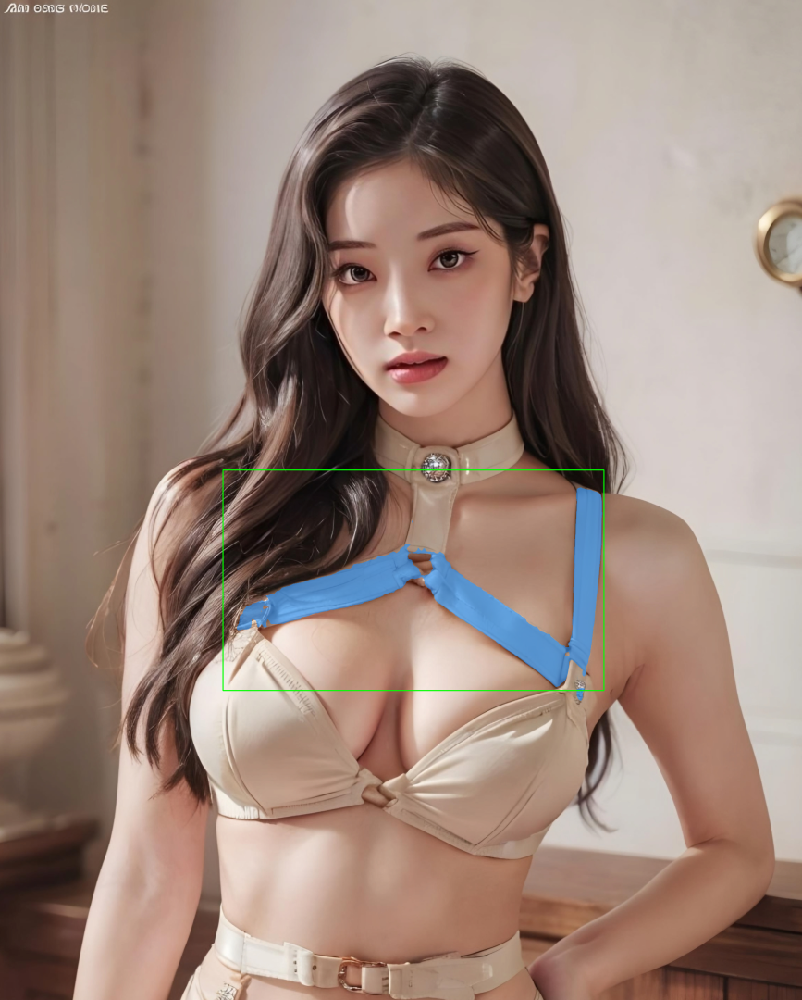

0.49766016006469727


In [22]:
from PIL import Image
import cv2
import numpy as np
import time
from IPython.display import display
s= time.time()
# Convert the PIL image to a NumPy array
image = np.array(Image.open(img_path))
input_box = np.array(bbox)
# Ensure the image is in the correct format (e.g., RGB to BGR for OpenCV)
if image.ndim == 3 and image.shape[2] == 3:  # RGB image
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

# Prepare other inputs
input_box_2d = np.expand_dims(input_box, axis=0)
input_point, input_label = None, None

# Call the function
img = show_res(masks, scores, input_point, input_label, input_box_2d, image)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

display(Image.fromarray(img))

e = time.time()
print(e-s)